In [15]:
import pandas as pd
import pickle
import eli5
import numpy as np
targets = ['Oil_norm', 'Gas_norm', 'Water_norm']
models={}
for tgt in targets:
    fl = f'../models/models_lgbm_{tgt}.pck'
    with open(fl,'rb') as f:
        models[tgt] = pickle.load(f) 


In [ ]:
k=3
tgt = 'Oil_norm'
for k in range(len(models[tgt])):
    exp = eli5.explain_weights(models[tgt][k])
    df = eli5.format_as_dataframe(exp)


In [ ]:
k=3
tgt = 'Water_norm'
for k in range(len(models[tgt])):
    exp = eli5.explain_weights(models[tgt][k],top =50)
    df = eli5.format_as_dataframe(exp)
    

# Look at the locations of wells:

In [38]:
labs =['Train','Validation','Test']
dfs = {}
for l in labs:
    df = pd.read_pickle(f'../data/final/{l}_final.pck')
    print(df.shape)
    dfs[l] = df
    
test_wells = pd.read_csv(f'../data/raw/regression_sample_submission_test.txt')['EPAssetsId']
dfs['Test'] = dfs['Test'].loc[ dfs['Test']['EPAssetsId'].isin(test_wells),:] 

df_all = pd.concat(list(dfs.values()),axis = 0,keys=list(dfs.keys())).reset_index(level=0)
print(df_all.shape)

df_all= df_all[(df_all['Gas_norm'] < 100) | df_all['Gas_norm'].isna()]
print(df_all.shape)

df_all.sample(5)
df_all['Gas_norm_log'] = np.log(df_all['Gas_norm'])
df_all['Oil_norm_log'] = np.log(df_all['Oil_norm'])
df_all['Water_norm_log'] = np.log(df_all['Water_norm'])

(6256, 34)
(1329, 34)
(1406, 30)
(8991, 35)
(8965, 35)


/home/geoanton/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  # This is added back by InteractiveShellApp.init_path()


In [39]:
import altair as alt
alt.renderers.enable('notebook')
alt.data_transformers.disable_max_rows()

DataTransformerRegistry.enable('default')

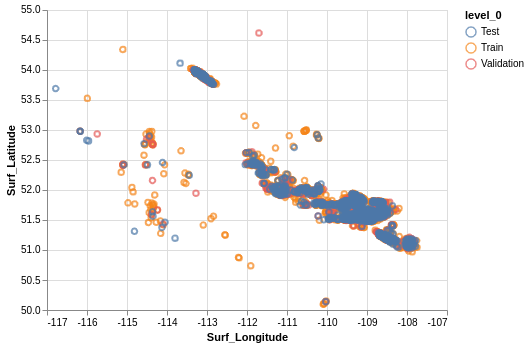

In [40]:
alt.Chart(data=df_all).encode(x=alt.Longitude('Surf_Longitude',scale=alt.Scale(zero=False)),y=alt.Latitude('Surf_Latitude',scale=alt.Scale(zero=False)),color='level_0').mark_point()

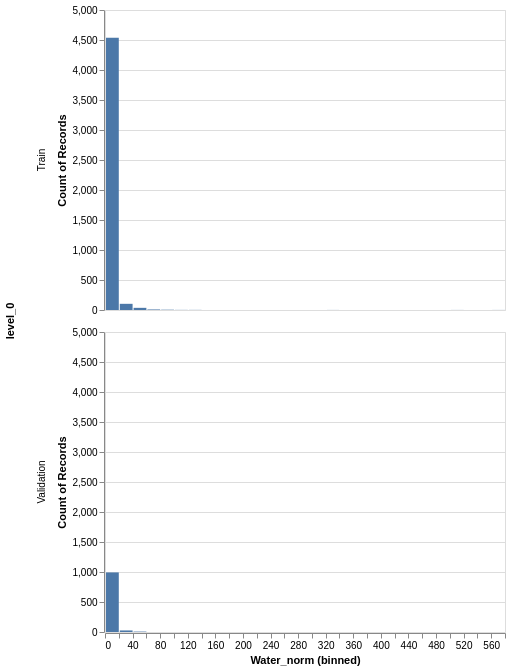

In [45]:

alt.Chart(data=df_all).encode(x=alt.X('Water_norm',bin=alt.Bin(maxbins=40)),y='count()',row='level_0').mark_bar()

14.225585587599998